In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter
import umap
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
import os
os.chdir('../IConNet/')
os.getcwd()

'/home/linh/projects/IConNet'

In [5]:
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
import gc
import sys
import numpy as np
from tqdm import tqdm

In [6]:
from IConNet.acov.audio_vqvae import VqVaeClsLoss
from IConNet.trainer.train_torch import get_dataloader
from IConNet.trainer.train_torch import Trainer_SCB10 as Trainer
from IConNet.acov.model import SCB7 as SCB
from omegaconf import OmegaConf as ocf

In [7]:
dataset_name = 'esd'
experiment_prefix = "scb7"
log_dir = f'../{experiment_prefix}_models/{dataset_name}/'
data_dir = "../data/data_preprocessed/"
dataset_config_path = f'config/dataset/{dataset_name}4.yaml'
dataset_config = ocf.load(dataset_config_path)
print(dataset_config)
batch_size = 2

{'name': 'esd', 'dataset_class': 'WaveformDataset', 'root': 'esd/', 'audio_dir': 'full_release/', 'feature_dir': 'features_4balanced/', 'label_name': 'label_emotion', 'feature_name': 'audio16k', 'num_classes': 4, 'label_values': ['anger', 'hapiness', 'neutral', 'sadness'], 'classnames': ['ang', 'hap', 'neu', 'sad'], 'target_labels': ['ang', 'neu', 'hap', 'sad']}


In [8]:
train_loader, test_loader, batch_size = get_dataloader(
    dataset_config, data_dir, batch_size=batch_size)

In [9]:
loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=1, loss_recon=1, loss_cls=0.15)
trainer = Trainer(batch_size=batch_size, log_dir=log_dir, 
                  experiment_prefix=experiment_prefix, device=device,
                 accumulate_grad_batches=4)
trainer.prepare(train_loader=train_loader, 
                test_loader=test_loader, 
                batch_size=batch_size,
               loss_ratio=loss_ratio)

In [10]:
in_channels = 1
out_channels = 8
embedding_dim = 1023
num_embeddings = 384
commitment_cost = 0.25
learning_rate = 1e-4
num_tokens = 256
num_classes = 4

In [11]:
model = SCB(
    in_channels=in_channels,
    out_channels=out_channels,
    num_embeddings=num_embeddings, 
    embedding_dim=embedding_dim, 
    num_tokens=num_tokens,
    num_classes=num_classes, 
    cls_dim=embedding_dim,
    sample_rate=16000,
    commitment_cost=commitment_cost,
    distance_type='euclidean',
    codebook_pretrained_path=None,
    freeze_codebook=False,
    loss_type='signal_loss',
)

In [12]:
trainer.setup(model=model, lr=learning_rate)

In [13]:
trainer.fit(
    n_epoch=50, lr=learning_rate, self_supervised=True, 
    train_task='embedding', test_n_epoch=None)

 25%|▏| 12.268571428554184/50 [10:13:46<34:02:18, 324Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7eb2a6b31340>>
Traceback (most recent call last):
  File "/opt/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7eb2a6b31340>>
Traceback (most recent call last):
  File "/opt/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
 25%|▏| 12.268660714268469/50 [10:13:46<31:27:38, 300


RuntimeError: DataLoader worker (pid(s) 3652822, 3652830, 3652838, 3652846, 3652854, 3652862, 3652870, 3652878) exited unexpectedly

In [14]:
trainer.save()

In [15]:
import pandas as pd
import IPython.display as ipd
import seaborn as sns
from pprint import pprint
from einops import reduce

from IConNet.acov.visualize import (
    visualize_speech_codebook, get_embedding_color, 
    visualize_embedding_umap, visualize_training_curves,
    get_embedding_color_v2, get_zcs_color_v2
)

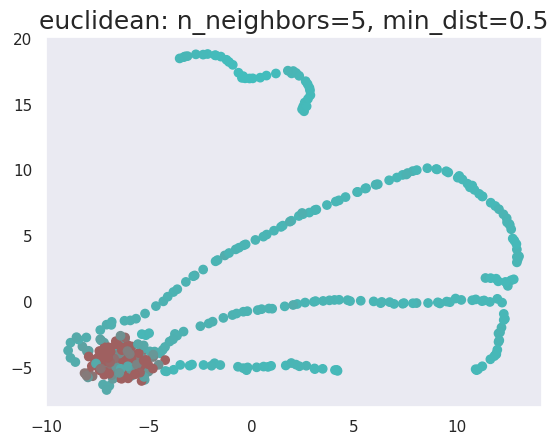

In [16]:
emb = model.embedding_filters.data.cpu()
emb_color, zcs = get_embedding_color_v2(emb)
k = 5
min_dist = 0.5
umap_metric = 'euclidean'
visualize_embedding_umap(emb, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

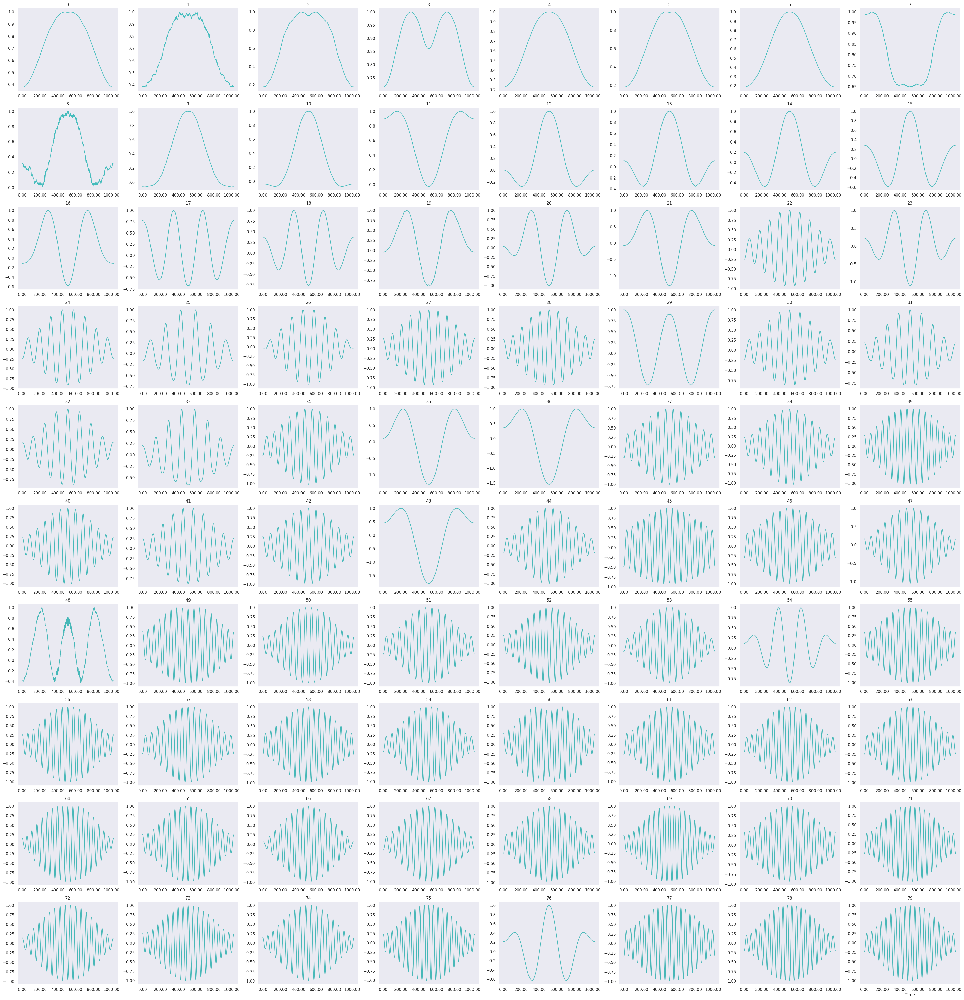

In [17]:
selected_emb_topk = torch.topk(zcs, 80)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

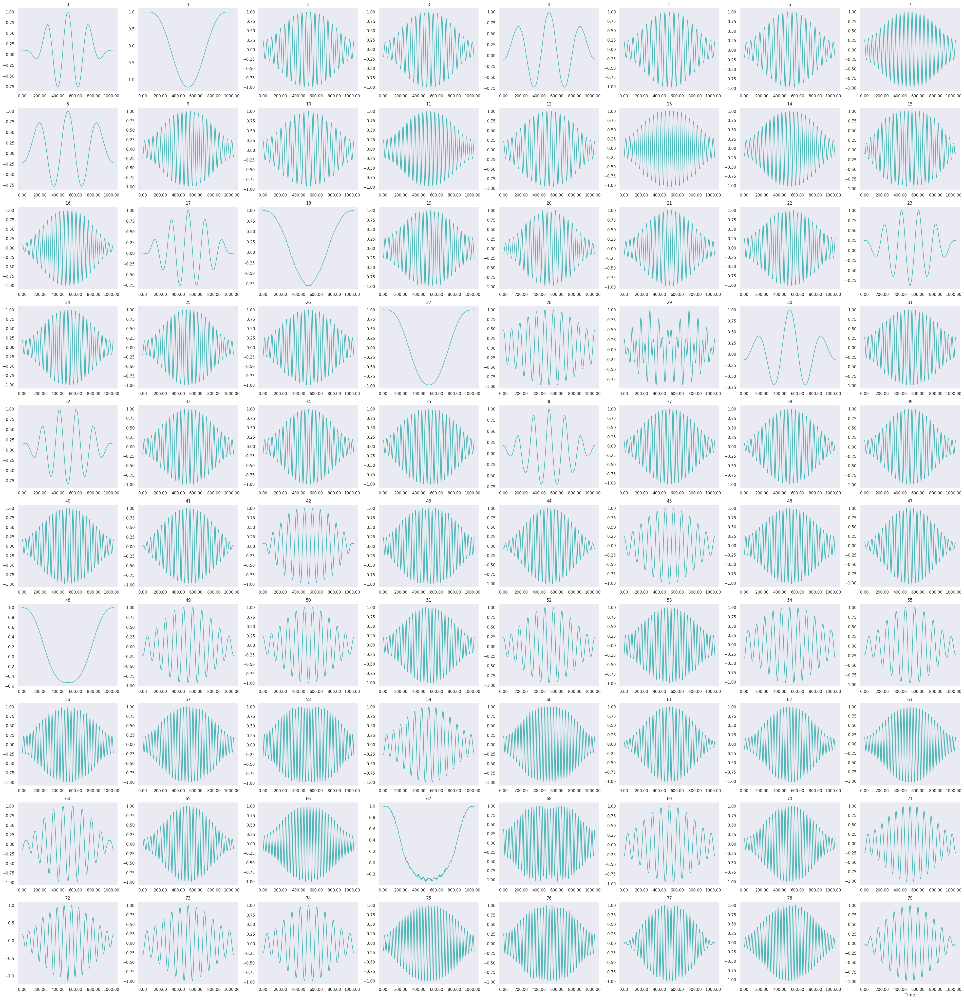

In [18]:
selected_emb_topk = torch.topk(zcs, 160)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

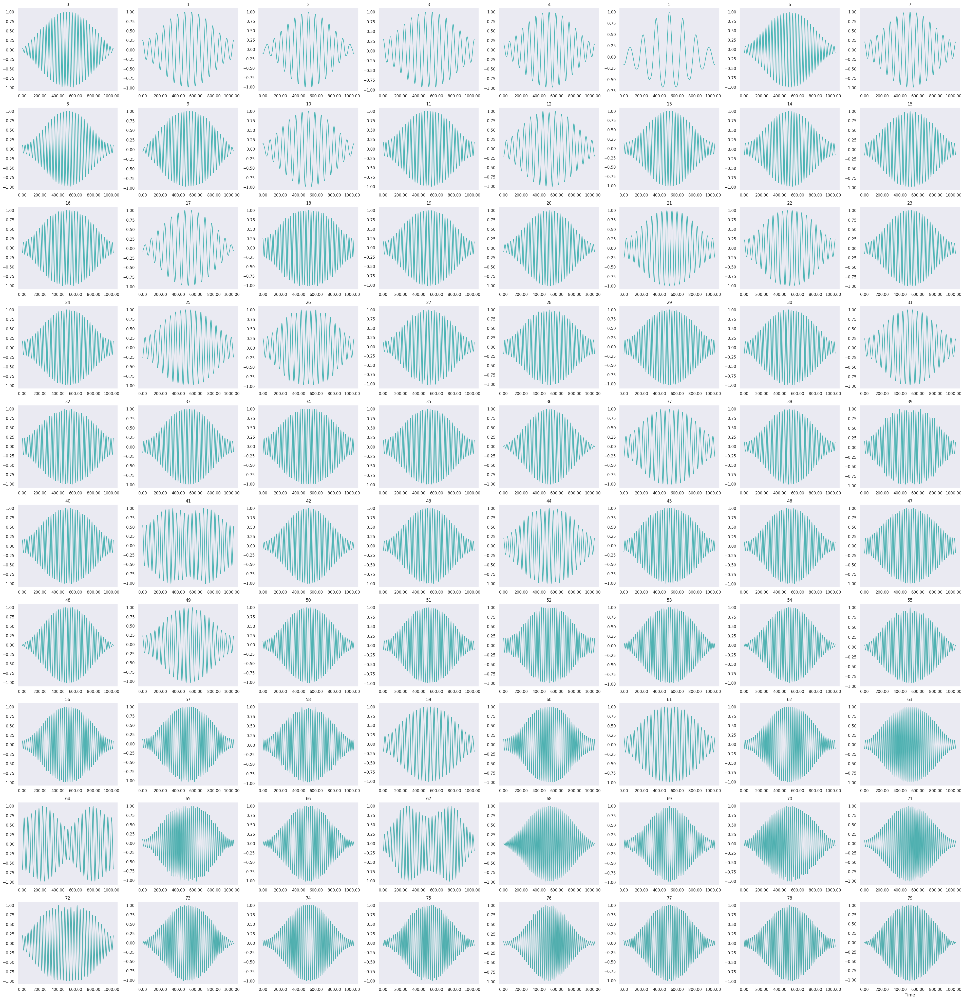

In [19]:
selected_emb_topk = torch.topk(zcs, 240)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

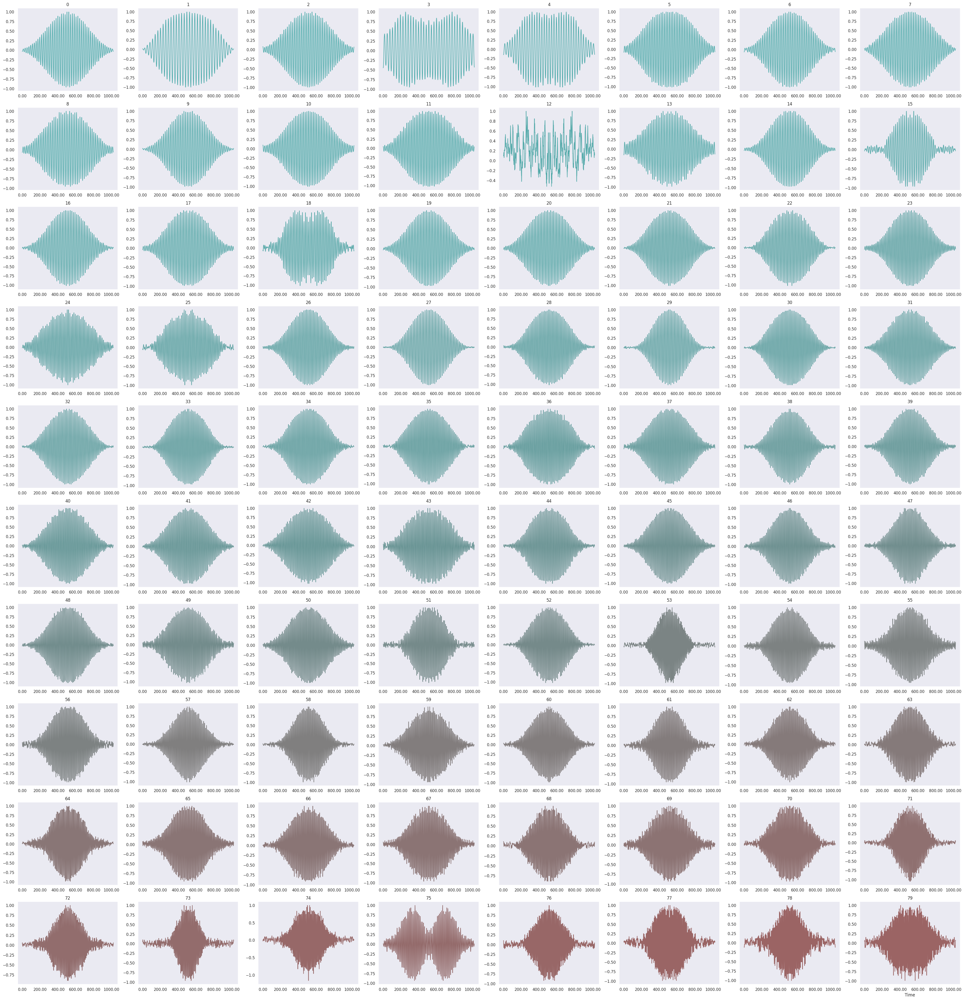

In [20]:
selected_emb_topk = torch.topk(zcs, 320)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

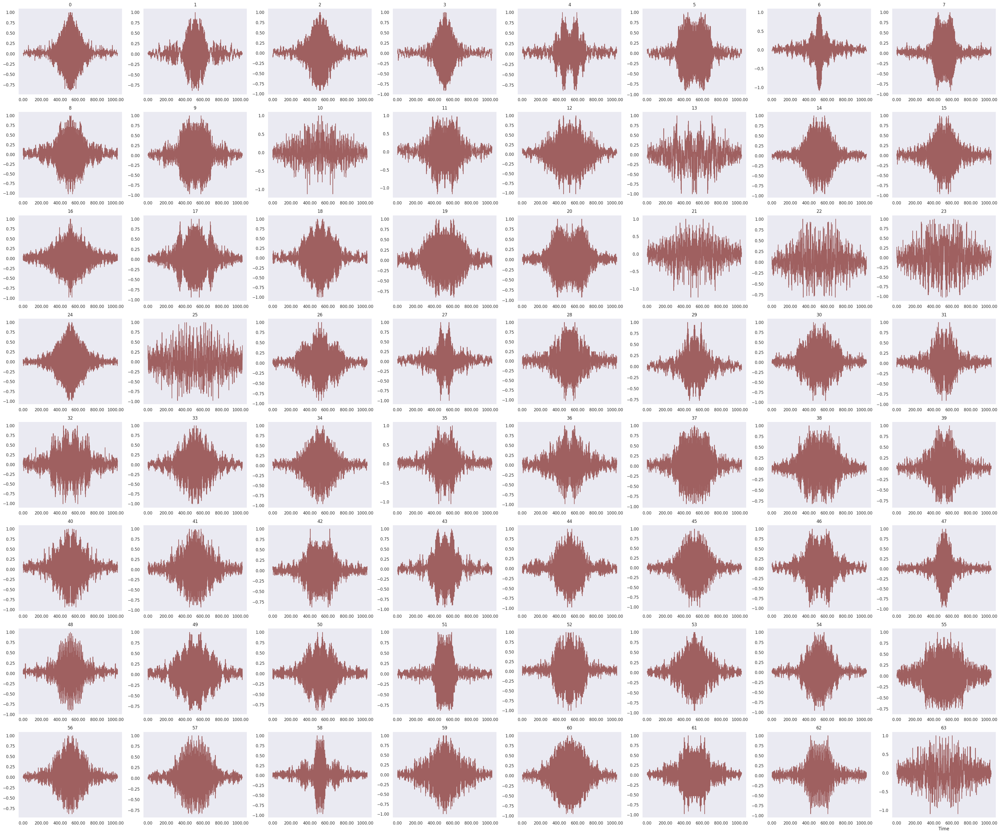

In [21]:
selected_emb_topk = torch.topk(zcs, 384)
selected_idx = selected_emb_topk.indices[-64:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=64, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

In [22]:
torch.save(emb, log_dir + 'codebook.epoch=13.pt')

In [ ]:
trainer.fit(
    n_epoch=30, lr=learning_rate, self_supervised=False, 
    train_task='embedding', test_n_epoch=5)

  5%| | 1.3636363636362068/30 [3:06:26<34:25:56, 4328

Correct: 3671/5600 (0.6555)
Saved new best test model: ../scb7_models/esd/model.epoch=14.step=111456.test_acc=0.6555.pt
{'acc_unweighted': tensor(0.6555),
 'acc_weighted': tensor(0.6555),
 'f1s_unweighted': tensor(0.6502),
 'f1s_weighted': tensor(0.6502),
 'rocauc': tensor(0.8939),
 'uar': tensor(0.6555),
 'wap': tensor(0.6656)}
{'acc_detail': tensor([0.6279, 0.4907, 0.6636, 0.8400]),
 'f1s_detail': tensor([0.6468, 0.5872, 0.6561, 0.7106]),
 'precision_detail': tensor([0.6669, 0.7309, 0.6487, 0.6157]),
 'recall_detail': tensor([0.6279, 0.4907, 0.6636, 0.8400]),
 'rocauc_detail': tensor([0.8957, 0.8947, 0.8748, 0.9105])}
tensor([[ 879,   84,  379,   58],
        [ 130,  687,   70,  513],
        [ 256,   52,  929,  163],
        [  53,  117,   54, 1176]])


 21%|▏| 6.363636363648499/30 [10:03:03<31:34:38, 4809

Correct: 4138/5600 (0.7389)
Saved new best test model: ../scb7_models/esd/model.epoch=19.step=153456.test_acc=0.7389.pt
{'acc_unweighted': tensor(0.7389),
 'acc_weighted': tensor(0.7389),
 'f1s_unweighted': tensor(0.7373),
 'f1s_weighted': tensor(0.7373),
 'rocauc': tensor(0.9341),
 'uar': tensor(0.7389),
 'wap': tensor(0.7523)}
{'acc_detail': tensor([0.8507, 0.7100, 0.5971, 0.7979]),
 'f1s_detail': tensor([0.7341, 0.7404, 0.6909, 0.7839]),
 'precision_detail': tensor([0.6455, 0.7735, 0.8196, 0.7703]),
 'recall_detail': tensor([0.8507, 0.7100, 0.5971, 0.7979]),
 'rocauc_detail': tensor([0.9324, 0.9360, 0.9220, 0.9462])}
tensor([[1191,   68,  121,   20],
        [ 149,  994,   19,  238],
        [ 413,   76,  836,   75],
        [  92,  147,   44, 1117]])


 38%|▍| 11.363636363675216/30 [17:33:59<26:03:30, 503

Correct: 4409/5600 (0.7873)
Saved new best test model: ../scb7_models/esd/model.epoch=24.step=195456.test_acc=0.7873.pt
{'acc_unweighted': tensor(0.7873),
 'acc_weighted': tensor(0.7873),
 'f1s_unweighted': tensor(0.7874),
 'f1s_weighted': tensor(0.7874),
 'rocauc': tensor(0.9530),
 'uar': tensor(0.7873),
 'wap': tensor(0.7976)}
{'acc_detail': tensor([0.7821, 0.8800, 0.7800, 0.7071]),
 'f1s_detail': tensor([0.7807, 0.7972, 0.7742, 0.7974]),
 'precision_detail': tensor([0.7794, 0.7286, 0.7685, 0.9141]),
 'recall_detail': tensor([0.7821, 0.8800, 0.7800, 0.7071]),
 'rocauc_detail': tensor([0.9476, 0.9580, 0.9435, 0.9631])}
tensor([[1095,  114,  184,    7],
        [  67, 1232,   41,   60],
        [ 219,   63, 1092,   26],
        [  24,  282,  104,  990]])


 43%|▍| 12.945616883164188/30 [20:29:11<110:58:22, 23

In [ ]:
trainer.fit(
    n_epoch=20, lr=learning_rate, self_supervised=False, 
    train_task='embedding', test_n_epoch=1)